In [1]:
import matplotlib.pyplot as plt
plt.rcParams["axes.grid"] = False

In [2]:
import scanpy as sc
import scarches as sca
import numpy as np

In [3]:
sc.set_figure_params(vector_friendly=True)

In [4]:
def filter_set_scores(scores, adata, filter_v=2.31):
    for k in scores:
        print(k)
        mask = np.abs(scores[k]['bf']) > filter_v
        s = sum(mask)
        if s > 0:
            sort = np.argsort(np.abs(scores[k]['bf'])[mask])[::-1]
            enriched_terms = adata.uns['terms'][mask][sort]
            
            print(enriched_terms)
            print(scores[k]['bf'][mask][sort])
            
            for term in enriched_terms:
                adata.obs[term] = adata.obsm['X_cvae'][:, adata.uns['active_terms'] == term]

### Pbmc Kang

In [5]:
adata = sc.read('kang_pbmc_integrated.h5ad')

In [6]:
adata.obs['condition_merged'] = adata.obs['condition'].tolist()
adata.obs['condition_merged'][adata.obs['condition_merged'].astype(str)=='nan'] = 'control'
adata.strings_to_categoricals()

<ipython-input-6-dcc145970c64>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['condition_merged'][adata.obs['condition_merged'].astype(str)=='nan'] = 'control'
... storing 'condition_merged' as categorical


In [7]:
intr_cvae = sca.models.TRVAE.load('q_intr_cvae_nolog_le_alpha_kl_0_5_0_001_sd_2020', adata)


INITIALIZING NEW NETWORK..............
Encoder Architecture:
	Input Layer in, out and cond: 1972 256 5
	Hidden Layer 1 in/out: 256 256
	Hidden Layer 2 in/out: 256 256
	Mean/Var Layer in/out: 256 282
Encoder Architecture:
	Input Layer in, out and cond: 1972 128 5
	Mean/Var Layer in/out: 128 1
Decoder Architecture:
	Masked linear layer in, out and cond:  282 1972 5


In [8]:
adata.uns['active_terms'] = adata.uns['terms'][intr_cvae.model.decoder.nonzero_terms()]

In [9]:
directions = intr_cvae._latent_directions(method="sum")

In [10]:
adata.obsm['X_cvae'] *= directions[intr_cvae.model.decoder.nonzero_terms()]

In [11]:
scores_cond = intr_cvae.latent_enrich('condition_merged', comparison="control", directions=directions, adata=adata)

In [12]:
filter_set_scores(scores_cond, adata)

stimulated
['INTERFERON_ALPHA_BETA_SIGNALIN' 'INTERFERON_SIGNALING']
[5.17 4.86]


In [13]:
adata.obs['INTERFERON_ALPHA_BETA_SIGNALING'] = adata.obs['INTERFERON_ALPHA_BETA_SIGNALIN']

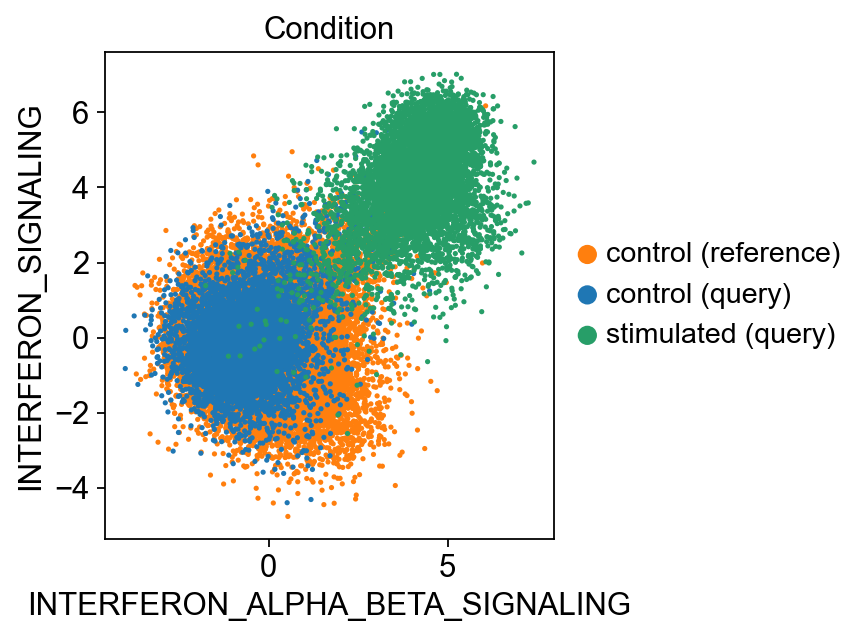

In [48]:
sc.pl.scatter(adata, x='INTERFERON_ALPHA_BETA_SIGNALING', y='INTERFERON_SIGNALING', 
              color='condition_joint', size=22, title='Condition', 
              groups=['control (reference)', 'control (query)', 'stimulated (query)'],
              save='_pbmc_kang_interferon.pdf')

In [16]:
scores_ct = intr_cvae.latent_enrich('cell_type_joint', directions=directions, n_perm=7000, adata=adata)

In [17]:
filter_set_scores(scores_ct, adata, filter_v=1.5)

CD16+ Monocytes
['METABOLISM_OF_AMINO_ACIDS_AND_' 'IMMUNOREGULATORY_INTERACTIONS_'
 'PLATELET_ACTIVATION_SIGNALING_' 'SIGNALING_BY_GPCR'
 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'IMMUNE_SYSTEM' 'METABOLISM_OF_MRNA'
 'METABOLISM_OF_NUCLEOTIDES' 'HEMOSTASIS' 'GENERIC_TRANSCRIPTION_PATHWAY'
 'AXON_GUIDANCE' 'AMYLOIDS' 'TRIF_MEDIATED_TLR3_SIGNALING']
[-2.67  2.45 -2.45  2.27  2.26 -2.09 -2.03 -1.81  1.76 -1.76 -1.57  1.52
 -1.52]
CD4+ T cells
['SIGNALING_BY_GPCR' 'ADAPTIVE_IMMUNE_SYSTEM' 'METABOLISM_OF_MRNA']
[-1.98  1.73  1.65]
CD14+ Monocytes
['DEVELOPMENTAL_BIOLOGY' 'METABOLISM_OF_LIPIDS_AND_LIPOP' 'HEMOSTASIS'
 'IMMUNE_SYSTEM' 'TRANSMEMBRANE_TRANSPORT_OF_SMA' 'INNATE_IMMUNE_SYSTEM'
 'AMYLOIDS' 'METABOLISM_OF_CARBOHYDRATES' 'METABOLISM_OF_NUCLEOTIDES'
 'METABOLISM_OF_MRNA' 'SIGNALING_BY_GPCR' 'CELL_CYCLE'
 'CYTOKINE_SIGNALING_IN_IMMUNE_S' 'BIOLOGICAL_OXIDATIONS'
 'METABOLISM_OF_AMINO_ACIDS_AND_' 'GPCR_DOWNSTREAM_SIGNALING'
 'GENERIC_TRANSCRIPTION_PATHWAY' 'ADAPTIVE_IMMUNE_SYSTEM'
 'MEMBRANE_TR

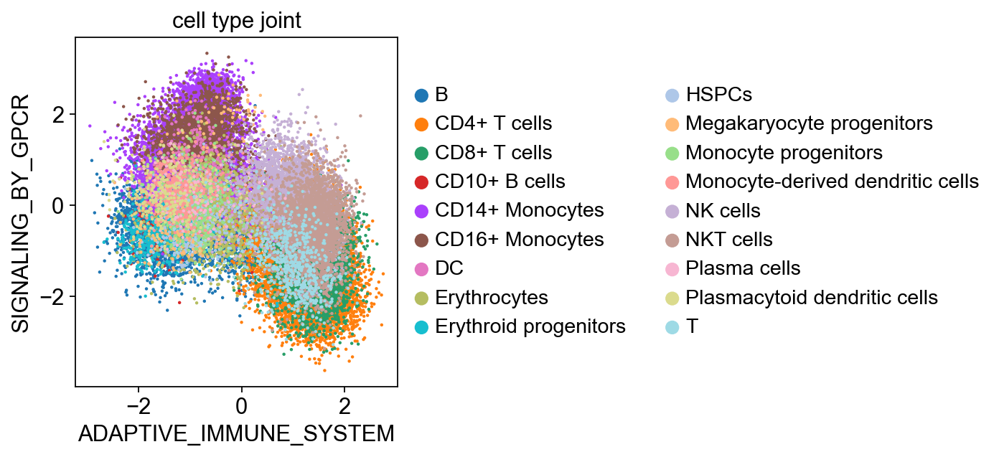

In [55]:
sc.pl.scatter(adata, x='ADAPTIVE_IMMUNE_SYSTEM', y='SIGNALING_BY_GPCR', 
              color='cell_type_joint', size=16)

### Figure

In [89]:
condition = 'condition_joint'
condition_loc = 'lower left'
groups = ['control (reference)', 'control (query)', 'stimulated (query)']

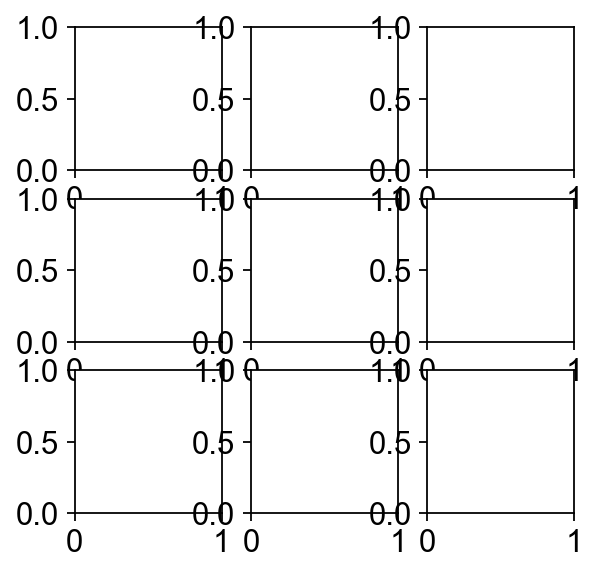

In [90]:
fig, axs = plt.subplots(3, 3)

In [91]:
adata.obs['MHC_CLASS_II_ANTIGEN_PRESENTATION'] = adata.obs['MHC_CLASS_II_ANTIGEN_PRESENTAT']
adata.obs['SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR'] = adata.obs['SIGNALING_BY_THE_B_CELL_RECEPT']

In [92]:
cell_mask = ~np.in1d(adata.obs['cell_type_joint'],['B', 'CD10+ B cells'])

In [93]:
adata.obs['cell_type_b'] = adata.obs['cell_type_joint'].astype('O')
adata.obs['cell_type_b'][cell_mask] = 'others'

<ipython-input-93-cdc8dac943e9>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['cell_type_b'][cell_mask] = 'others'


... storing 'cell_type_b' as categorical


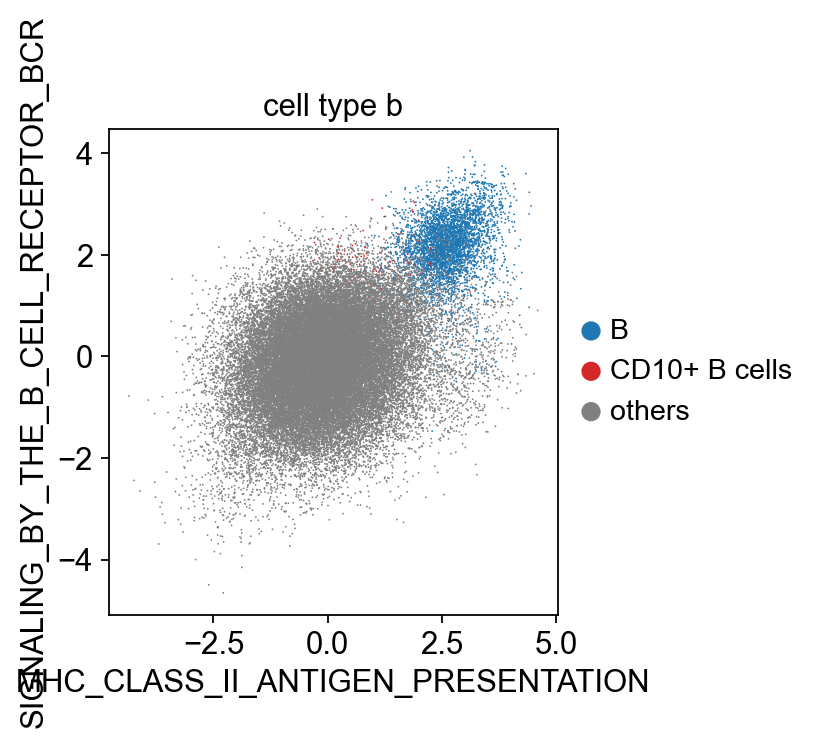

In [94]:
sc.pl.scatter(adata, x='MHC_CLASS_II_ANTIGEN_PRESENTATION', y='SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR', 
              color='cell_type_b')

In [95]:
for i, cat in enumerate(adata.obs['cell_type_b'].cat.categories):
    if cat=='others':
        adata.uns['cell_type_b_colors'][i] = 'gray'
    else:
        idx = adata.obs['cell_type_joint'].cat.categories == cat
        adata.uns['cell_type_b_colors'][i] = np.array(adata.uns['cell_type_joint_colors'])[idx][0]

In [96]:
sc.pl.scatter(adata, x='SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR', y='MHC_CLASS_II_ANTIGEN_PRESENTATION', 
              color='cell_type_b', size=16, title='B cells', legend_loc='lower left', ax=axs[0,0])

In [97]:
sc.pl.scatter(adata, x='SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR', y='INTERFERON_ALPHA_BETA_SIGNALING', 
              color='cell_type_b', size=16, title='B cells', legend_loc='lower left', ax=axs[0,1])

In [98]:
sc.pl.scatter(adata, x='SIGNALING_BY_THE_B_CELL_RECEPTOR_BCR', y='INTERFERON_ALPHA_BETA_SIGNALING', 
              color=condition, size=16, title='B cells condition', legend_loc=condition_loc, groups=groups, ax=axs[0,2])

In [99]:
fig.set_size_inches(20, 16)

In [100]:
fig.tight_layout() 

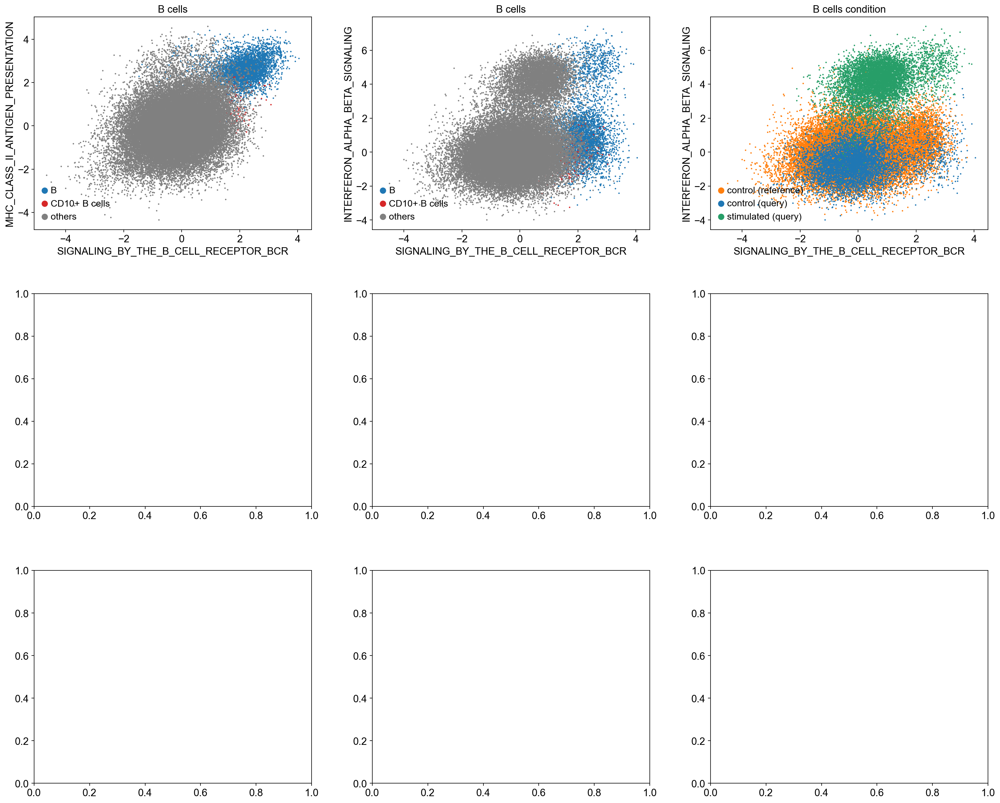

In [101]:
fig

In [102]:
adata.obs['METABOLISM_OF_LIPIDS_AND_LIPOPROTEINS'] = adata.obs['METABOLISM_OF_LIPIDS_AND_LIPOP']
adata.obs['METABOLISM_OF_AMINO_ACIDS_AND_DERIVATIVES'] = adata.obs['METABOLISM_OF_AMINO_ACIDS_AND_']

In [103]:
cell_mask = ~np.in1d(adata.obs['cell_type_joint'],['CD14+ Monocytes', 'CD16+ Monocytes', 'Monocyte progenitors',
                                                   'Monocyte-derived dendritic cells'])

In [104]:
adata.obs['cell_type_m'] = adata.obs['cell_type_joint'].astype('O')
adata.obs['cell_type_m'][cell_mask] = 'others'

<ipython-input-104-2897a1728866>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['cell_type_m'][cell_mask] = 'others'


... storing 'cell_type_m' as categorical


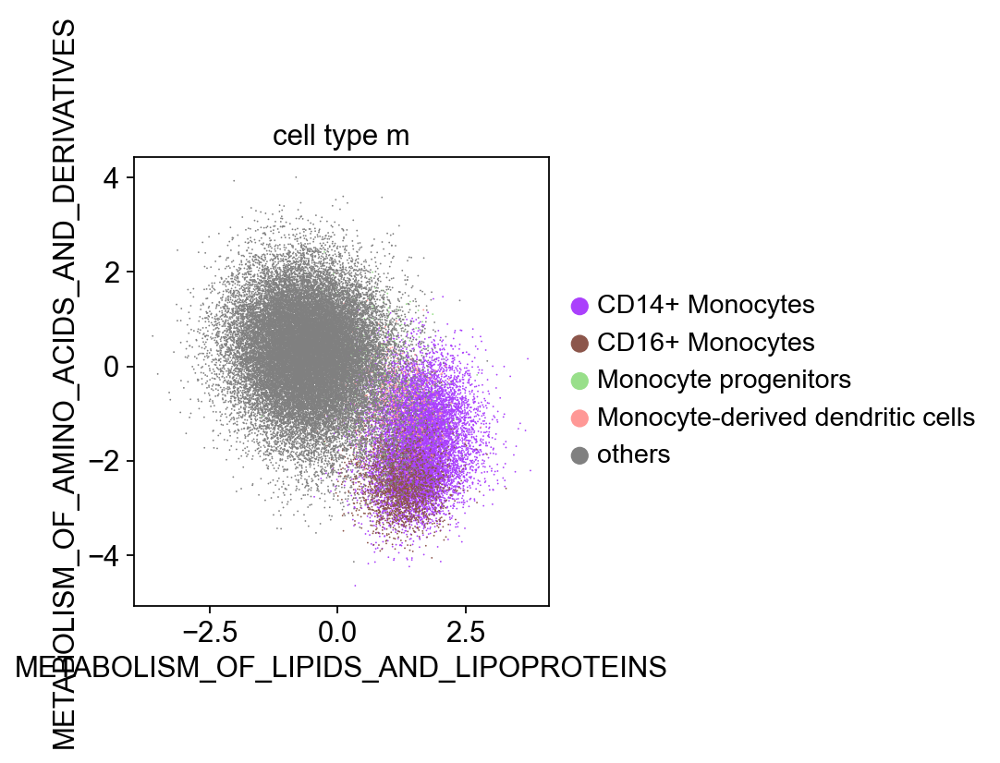

In [105]:
sc.pl.scatter(adata, x='METABOLISM_OF_LIPIDS_AND_LIPOPROTEINS', y='METABOLISM_OF_AMINO_ACIDS_AND_DERIVATIVES', 
              color='cell_type_m')

In [106]:
for i, cat in enumerate(adata.obs['cell_type_m'].cat.categories):
    if cat=='others':
        adata.uns['cell_type_m_colors'][i] = 'gray'
    else:
        idx = adata.obs['cell_type_joint'].cat.categories == cat
        adata.uns['cell_type_m_colors'][i] = np.array(adata.uns['cell_type_joint_colors'])[idx][0]

In [107]:
sc.pl.scatter(adata, x='METABOLISM_OF_LIPIDS_AND_LIPOPROTEINS', y='METABOLISM_OF_AMINO_ACIDS_AND_DERIVATIVES', 
              color='cell_type_m', size=16, title='Monocytes', legend_loc='lower left', ax=axs[1,0])

In [108]:
sc.pl.scatter(adata, x='METABOLISM_OF_LIPIDS_AND_LIPOPROTEINS', y='INTERFERON_ALPHA_BETA_SIGNALING', 
              color='cell_type_m', size=16, title='Monocytes', legend_loc='lower left', ax=axs[1,1])

In [109]:
sc.pl.scatter(adata, x='METABOLISM_OF_LIPIDS_AND_LIPOPROTEINS', y='INTERFERON_ALPHA_BETA_SIGNALING', 
              color=condition, size=16, title='Monocytes condition', legend_loc=condition_loc, groups=groups, ax=axs[1,2])

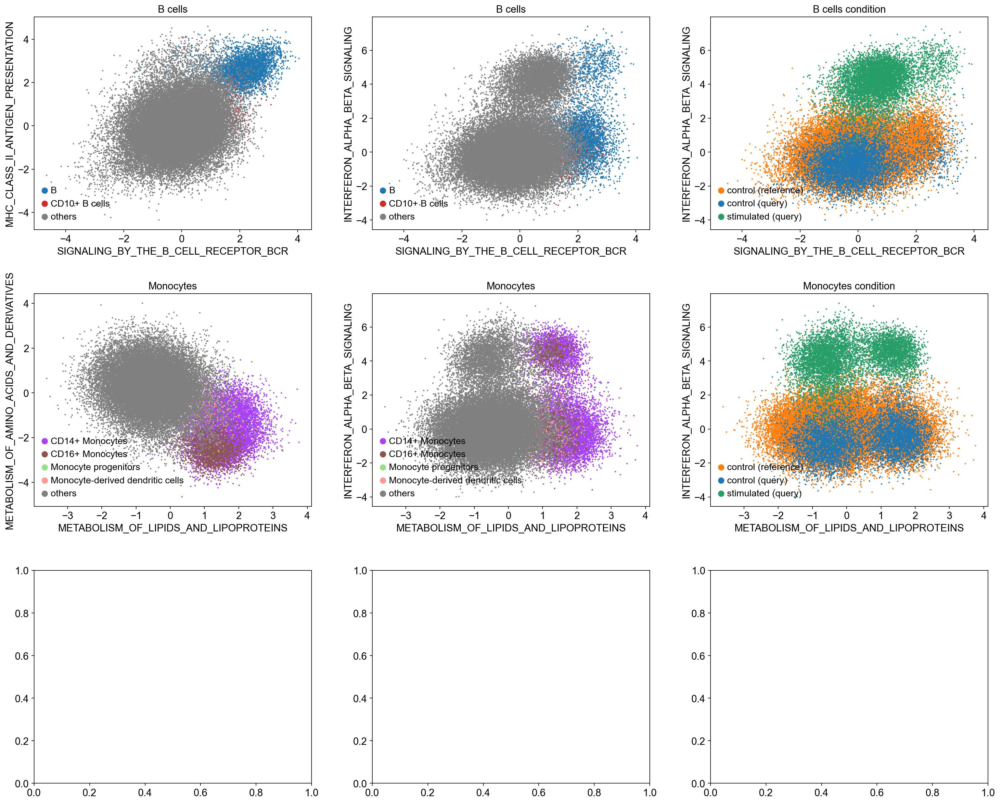

In [110]:
fig

In [111]:
cell_mask = ~np.in1d(adata.obs['cell_type_joint'],['CD4+ T cells', 'CD8+ T cells', 'T', 'NKT cells'])

In [112]:
adata.obs['cell_type_t'] = adata.obs['cell_type_joint'].astype('O')
adata.obs['cell_type_t'][cell_mask] = 'others'

<ipython-input-112-c942e274ea05>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs['cell_type_t'][cell_mask] = 'others'


... storing 'cell_type_t' as categorical


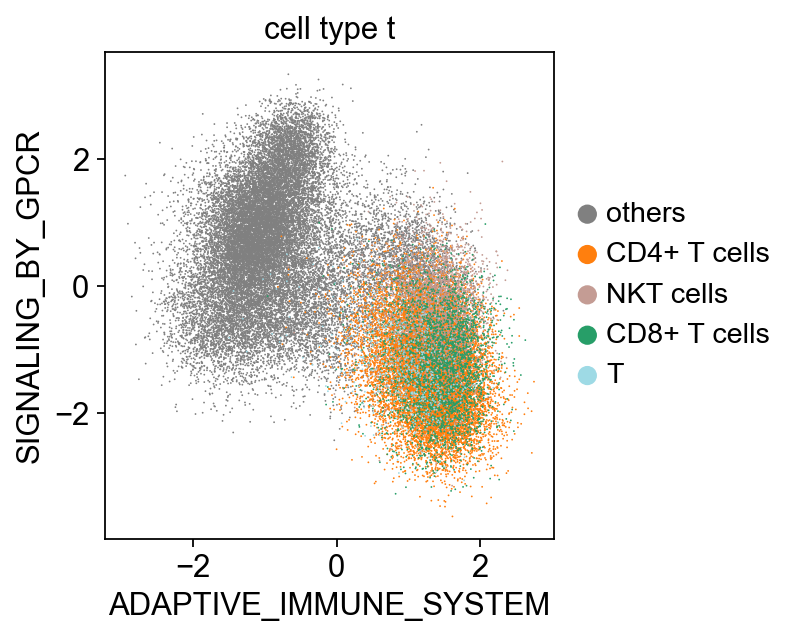

In [113]:
sc.pl.scatter(adata, x='ADAPTIVE_IMMUNE_SYSTEM', y='SIGNALING_BY_GPCR', 
              color='cell_type_t', groups=['others', 'CD4+ T cells', 'NKT cells', 'CD8+ T cells', 'T'])

In [114]:
for i, cat in enumerate(adata.obs['cell_type_t'].cat.categories):
    if cat=='others':
        adata.uns['cell_type_t_colors'][i] = 'gray'
    else:
        idx = adata.obs['cell_type_joint'].cat.categories == cat
        adata.uns['cell_type_t_colors'][i] = np.array(adata.uns['cell_type_joint_colors'])[idx][0]

In [115]:
sc.pl.scatter(adata, x='ADAPTIVE_IMMUNE_SYSTEM', y='SIGNALING_BY_GPCR', 
              color='cell_type_t', size=16, title='T cells', legend_loc='lower right', ax=axs[2,0])

In [116]:
sc.pl.scatter(adata, x='ADAPTIVE_IMMUNE_SYSTEM', y='INTERFERON_ALPHA_BETA_SIGNALING', 
              color='cell_type_t', size=16, title='T cells', legend_loc='lower right', ax=axs[2,1])

In [117]:
sc.pl.scatter(adata, x='ADAPTIVE_IMMUNE_SYSTEM', y='INTERFERON_ALPHA_BETA_SIGNALING', 
              color=condition, size=16, title='T cells condition', legend_loc=condition_loc, groups=groups, ax=axs[2,2])

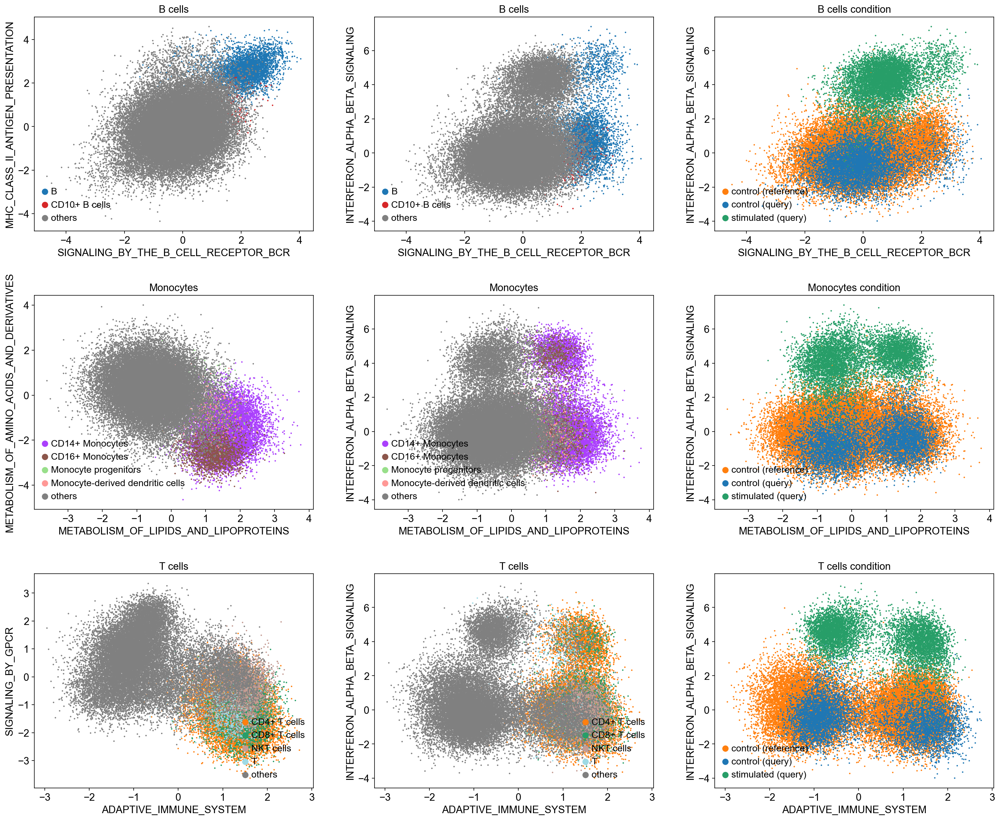

In [118]:
fig

In [119]:
fig.savefig('pbmc_kang_cell_types_merged.pdf', bbox_inches = "tight")